# Laboratory #05 : Corner detection and ORB

At the end of this laboratory, you would get familiarized with

*   Corner Detection using FAST and Harris Corners
*   ORB feature detectors and descriptors

**Remember this is a graded exercise.**

*   For every plot, make sure you provide appropriate titles, axis labels, legends, wherever applicable.
*   Create reusable functions where ever possible, so that the code could be reused at different places.
*   Mount your drive to access the images.
*   Add sufficient comments and explanations wherever necessary.

---

# **Students** (First Name and Last Name)

1. Eva Veli  
2. Tatevik Davtyan

---

In [ ]:
# Loading necessary libraries (Feel free to add new libraries if you need for any computation)

import numpy as np
from matplotlib import pyplot as plt
import os
from skimage import color, data, feature, filters, io, transform
import numpy as np
from matplotlib import pyplot as plt
import os
from skimage import io, data, color, transform
from skimage.feature import corner_fast, corner_peaks, ORB, match_descriptors, plot_matches, corner_harris

# Corner Detection

### Exercise: #1

*    Detect the corners in the image starbucks4.jpg. Use corner_fast to extract FAST corners for the given image and corner_peaks to find corners in the corner measure response image.
*   Show the original image, fast corners, peaks overlayed on the original image using matplotlib subplot.



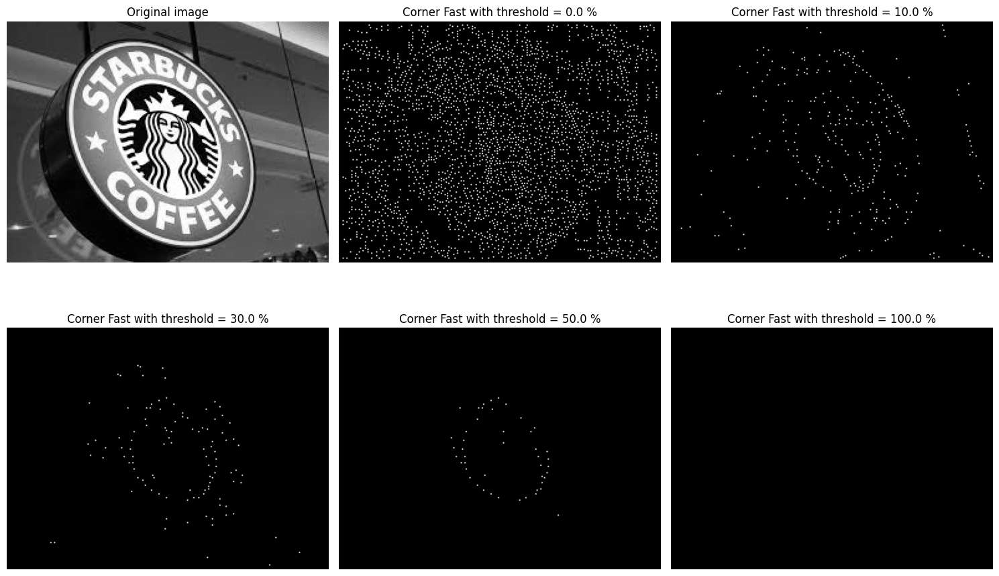

In [ ]:
# solution
def create_image_from_peaks(image_shape, peaks):
  new_image = np.zeros(image_shape)
  new_image[peaks[:,0],peaks[:,1]] = 1
  return new_image

starbucks4_image = io.imread('starbucks4.jpg',as_gray=True)
thresholds = [0.0,0.1,0.3,0.5,1.0]
thresholds_names = ["Original image"]
cornerFast_images = [starbucks4_image]

for threshold in thresholds:
  starbucks4_image_cornerFast_tr = corner_fast(starbucks4_image, threshold=threshold)
  starbucks4_cornerPeaks = corner_peaks(starbucks4_image_cornerFast_tr)

  starbucks4_image_cornerPeaks_tr = create_image_from_peaks(starbucks4_image.shape,starbucks4_cornerPeaks)
  cornerFast_images.append(starbucks4_image_cornerPeaks_tr)
  thresholds_names.append(f"Corner Fast with threshold = {threshold*100} %")

num_images = len(cornerFast_images)
cols = 3
rows = num_images // cols + int(num_images % cols > 0)

fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
axes = axes.flatten()  # Flatten in case of multiple rows

# Plot each image with its corresponding title
for idx, (ax, img, title) in enumerate(zip(axes, cornerFast_images, thresholds_names)):
    ax.imshow(img, cmap='gray')
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()

*   Analyze and discuss the effect of changing **'threshold'** in the corner_fast function.

**Solution**

Before answering this question, we would like to emphasize that we have used the corner_fast function, with the threshold applied to it, to extract the corners. Then, we used the corner_peaks function with the default parameters to obtain only the corner peaks. We have done it this way because in the next exercise we are going to compare it with the results of this one.
Watching the different corners extracted with the corner_fast function, we can say that the lower the threshold of the corner peaks function, the higher the number of points that we can see on the image. So the number of points shown  seems to be linearly related to the threshold parameter.


*   Repeat the exercise by replacing FAST corners with Harris corners.

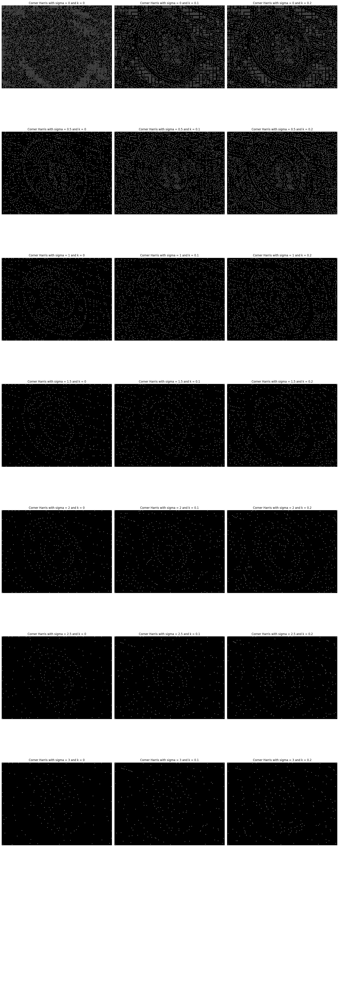

In [ ]:
thresholds_names = []
cornerHarris_images = []

sigmas = [0,0.5,1,1.5,2,2.5,3]
ks = [0,0.1,0.2]
for sigma in sigmas:
  for k in ks:
    starbucks4_image_cornerHarris_tr = corner_harris(starbucks4_image, k=k, sigma=sigma)
    starbucks4_cornerPeaks = corner_peaks(starbucks4_image_cornerHarris_tr)

    starbucks4_image_cornerPeaks_tr = create_image_from_peaks(starbucks4_image.shape,starbucks4_cornerPeaks)
    cornerHarris_images.append(starbucks4_image_cornerPeaks_tr)
    thresholds_names.append(f"Corner Harris with sigma = {sigma} and k = {k}")

fig, axes = plt.subplots(len(cornerHarris_images) // 3 + 1, 3, figsize=(20, 60))
axes = axes.ravel()

for idx, (image, title) in enumerate(zip(cornerHarris_images, thresholds_names)):
    axes[idx].imshow(image, cmap='gray')
    axes[idx].set_title(title)
    axes[idx].axis('off')

# Hide any extra subplots if the number of images isn't a multiple of 4
for i in range(len(cornerHarris_images), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

*   Do you find difference between both the techniques? If so, why and what difference do you observe?

**Solution**

Since the corner_harris function lacks a threshold parameter, we used the k and sigma parameters instead and applied corner_peaks with default settings to extract significant corners. Analyzing the corner_fast function revealed that the sigma value greatly affects the number of detected corners—higher sigma values result in fewer corners due to increased image smoothing. Additionally, increasing the sensitivity factor k slightly raises the number of corners and causes edges to break into more distinct corners, enhancing edge detail. However, a large sigma makes corners more sparsely distributed, potentially missing genuine features. The primary difference between corner_fast and corner_harris lies in the detected corners and their intensities: corner_fast identifies corners with more uniform intensities, while corner_harris detects corners with a wider range of intensities. Overall, the choice of sigma and k parameters significantly influences the behavior and output of these corner detection algorithms, catering to different image analysis needs.

...

# ORB feature detector and binary descriptor

### Exercise #0: Compute ORB descriptors and find descriptors match

*   Load 'astronaut' image from data module.
*   Convert the image to grayscale.
*   Create a copy of the image and rotate it by 180&deg;



In [ ]:
img1 = color.rgb2gray(data.astronaut())
img2 = transform.rotate(img1, 180)

*   Create an ORB feature detector with default parameters. *Hint: ORB feature detector is available in skimage.feature module.*



In [ ]:
descriptor_extractor = feature.ORB(n_keypoints=200)

*   Extract the keypoints and descriptors using detect_and_extract function for both the images

In [ ]:
descriptor_extractor.detect_and_extract(img1)
keypoints1 = descriptor_extractor.keypoints
descriptors1 = descriptor_extractor.descriptors

descriptor_extractor.detect_and_extract(img2)
keypoints2 = descriptor_extractor.keypoints
descriptors2 = descriptor_extractor.descriptors

*   Descriptors can be matched using match_descriptors function available in skimage.feature module
*   The matches can be plotted using the plot_matches function available in skimage.feature module

<ipython-input-16-981b87635042>:2: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  feature.plot_matches(plt, img1, img2, keypoints1, keypoints2, matches12)


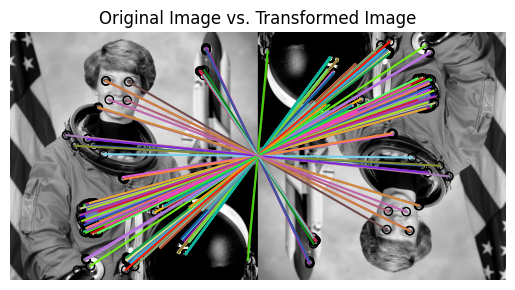

In [ ]:
matches12 = feature.match_descriptors(descriptors1, descriptors2, cross_check=True)
feature.plot_matches(plt, img1, img2, keypoints1, keypoints2, matches12)
plt.axis('off')
plt.title("Original Image vs. Transformed Image")
plt.show()

### Exercise: #1

*   Analyze and discuss the effect of changing the parameter **'max_ratio'** in the match_descriptors function.

<ipython-input-18-0fdfe575fcd8>:6: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  plot_matches(plt, img1, img2, keypoints1, keypoints2, matches)


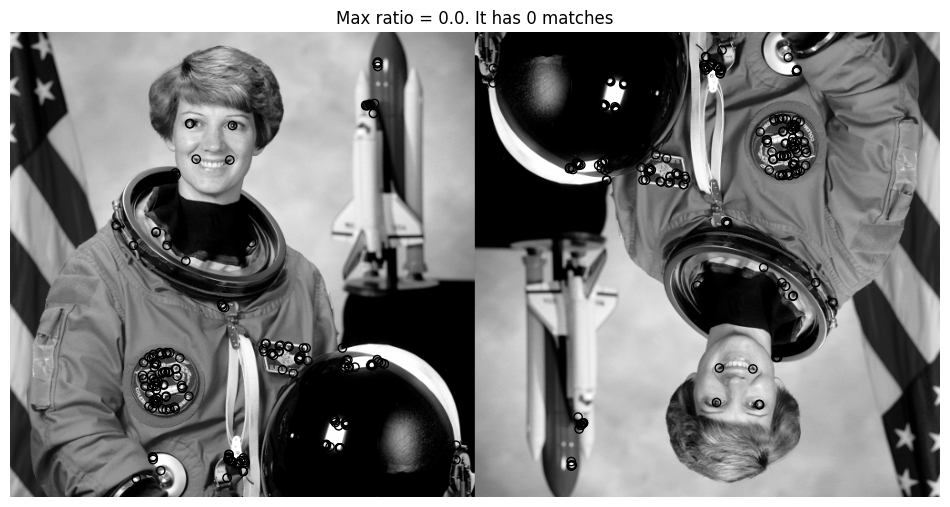

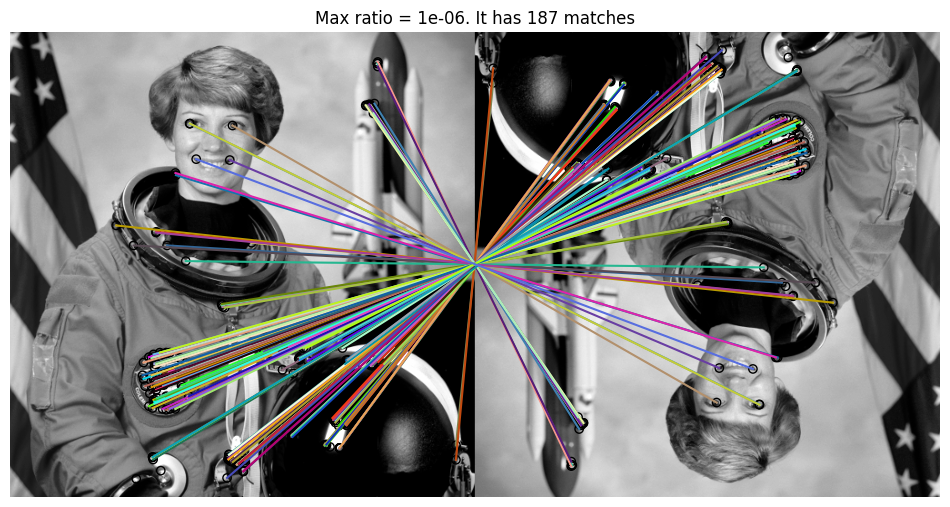

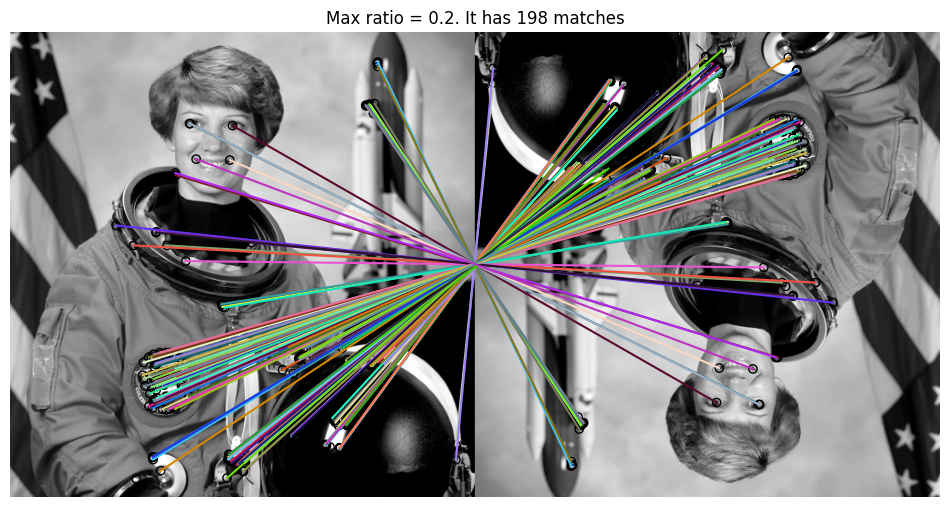

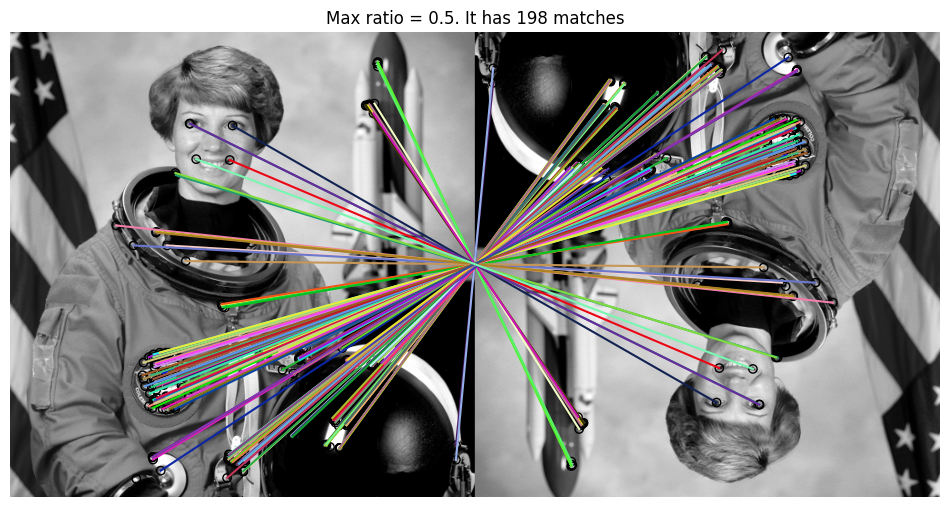

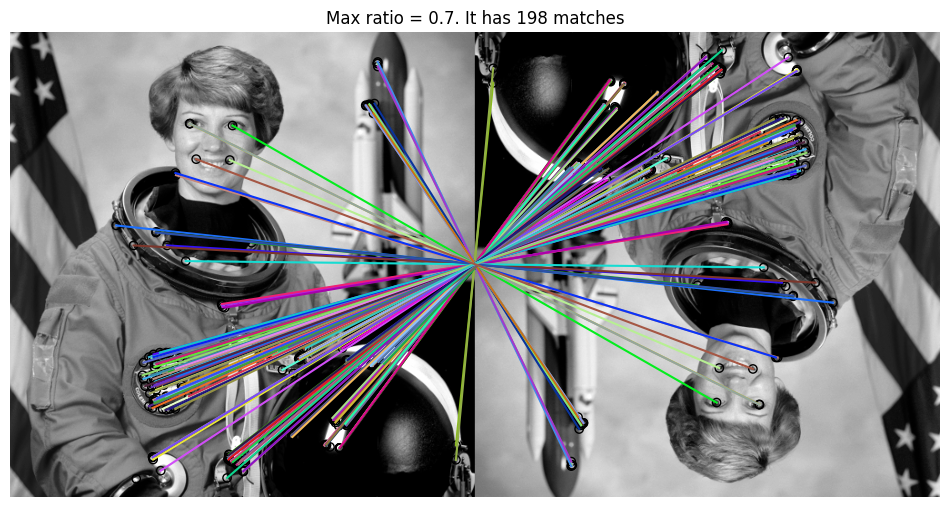

In [ ]:
thresholds = [0.0, 0.000001, 0.2, 0.5, 0.7]
for threshold in thresholds:
  matches = match_descriptors(descriptors1, descriptors2, cross_check=True, max_ratio=threshold)

  fig, axs = plt.subplots(figsize=(12,12))
  plot_matches(plt, img1, img2, keypoints1, keypoints2, matches)
  plt.axis('off')
  plt.title(f"Max ratio = {threshold}. It has {len(matches)} matches")
  plt.show()

**Solution**

We observed that varying the max_ratio within the range [0, 1) did not lead to significant changes in the number of matches. Setting max_ratio = 0 resulted in zero matches, but increasing it slightly (10^{-6}) led to 191 matches. This suggests that small, incremental changes in max_ratio do not allow for gradual observation of effects. When set to 0.2, the number of matches reached a peak of 198. In essence, max_ratio acts as a threshold to filter out ambiguous matches: a lower max_ratio leads to fewer matches by enforcing stricter criteria, while a higher max_ratio increases the number of matches but risks including more ambiguous or incorrect ones.

*   What do you infer from **'harris_k'**, **'n_scales'**, **'fast_n'**, **'fast_threshold'** parameters in ORB function?

**Solution**

- harris_k: This parameter, similar to k in skimage.feature.corner_harris, controls sensitivity in distinguishing corners from edges, typically within [0, 0.2]. Lower values of k allow for the detection of more sharp corners, while higher values (closer to 0.2) result in fewer, less distinct corners.
- n_scales: This defines the maximum number of scales or levels in the image pyramid used to extract features. It determines how many times the function blurs the image, which helps in detecting corners across different levels of detail.
- fast_n: Corresponding to n in skimage.feature.corner_fast, this sets the minimum number of consecutive pixels (out of 16) on a circle around a test pixel that must be either brighter or darker to classify it as a corner.
-fast_threshold: Equivalent to the threshold parameter in corner_fast, this determines whether pixels on the circle are brighter, darker, or similar compared to the test pixel. Lowering the threshold increases the number of detected corners, while raising it reduces the count, making the detection stricter.

...

### Exercise: #2
*   Using the above example, create a function get_ORB, that takes two images as parameters and returns the keypoints of both images and descriptor matches

In [ ]:
# solution
def get_ORB(image1, image2, n_keypoints=200, harris_k=0.04):
  descriptor_extractor = ORB(n_keypoints=n_keypoints, harris_k=harris_k)

  descriptor_extractor.detect_and_extract(image1)
  keypoints1 = descriptor_extractor.keypoints
  descriptors1 = descriptor_extractor.descriptors

  descriptor_extractor.detect_and_extract(image2)
  keypoints2 = descriptor_extractor.keypoints
  descriptors2 = descriptor_extractor.descriptors

  return (keypoints1,keypoints2),(descriptors1,descriptors2)


*   Using the above function, detect the correspondences between the model image 'starbucks.jpg' with the scene image 'starbucks4.jpg'
*   Plot the matches between the two images.

<ipython-input-26-2abd6c49b964>:7: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  plot_matches(plt, starbucks_image, starbucks4_image, keypoints1, keypoints2, matches)


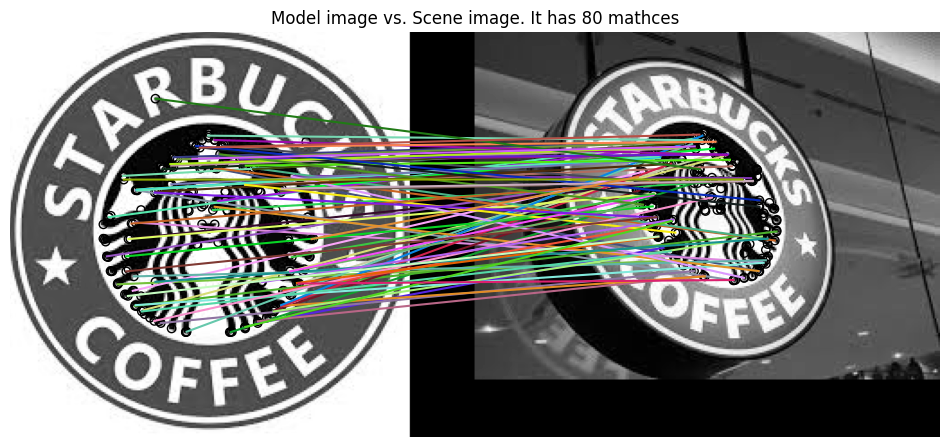

In [ ]:
starbucks_image  = io.imread('starbucks.jpg',as_gray=True)
starbucks4_image = io.imread('starbucks4.jpg',as_gray=True)
(keypoints1,keypoints2),(descriptors1,descriptors2) = get_ORB(starbucks_image,starbucks4_image)
matches = match_descriptors(descriptors1, descriptors2, cross_check=True)

fig, axs = plt.subplots(figsize=(12,12))
plot_matches(plt, starbucks_image, starbucks4_image, keypoints1, keypoints2, matches)
plt.axis('off')
plt.title("Model image vs. Scene image. It has "+str(len(matches))+" mathces")
plt.show()


### Exercise: #3

*   Using "starbucks.jpg" image as a model, show its matches to all Starbucks images.
*   Show the number of the matches for the pair as title for each plot.

<ipython-input-39-954ee59ad98f>:11: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  plot_matches(plt, starbucks_image, starbucks_image_2, keypoints1, keypoints2, matches)


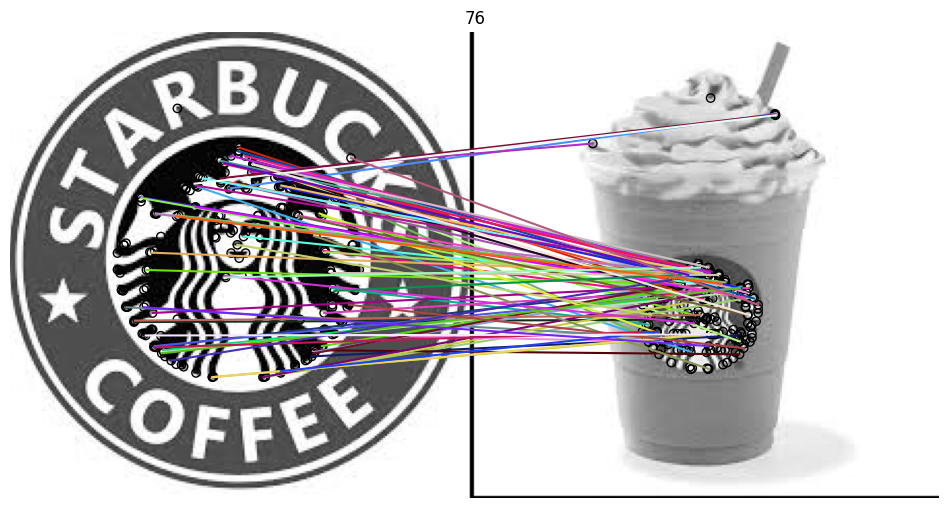

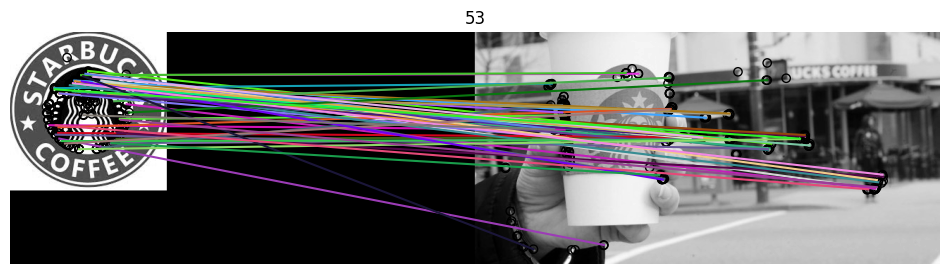

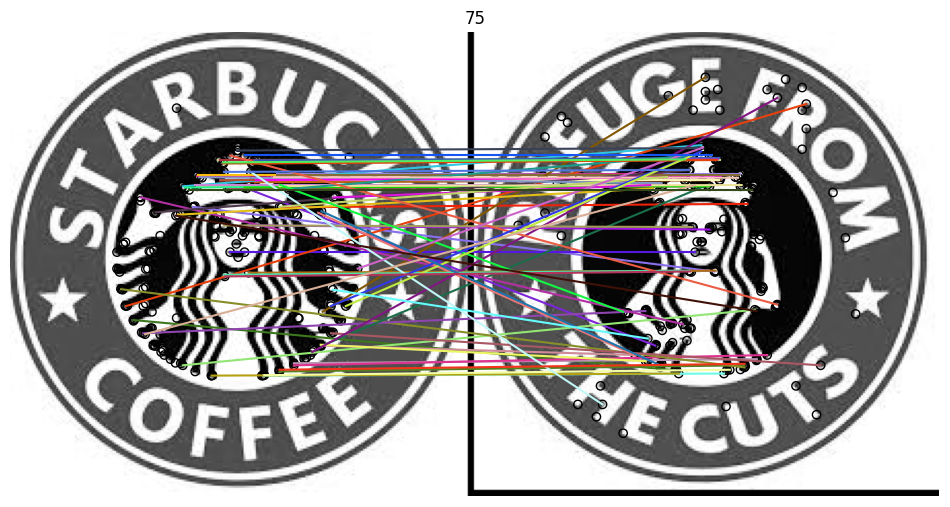

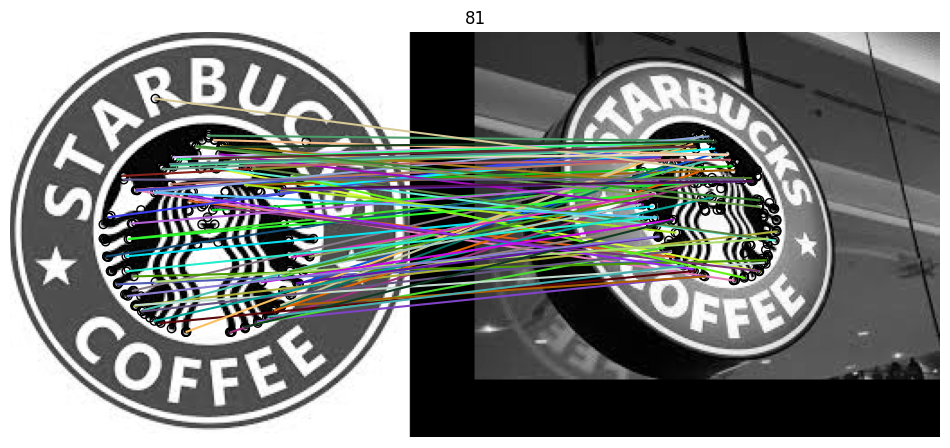

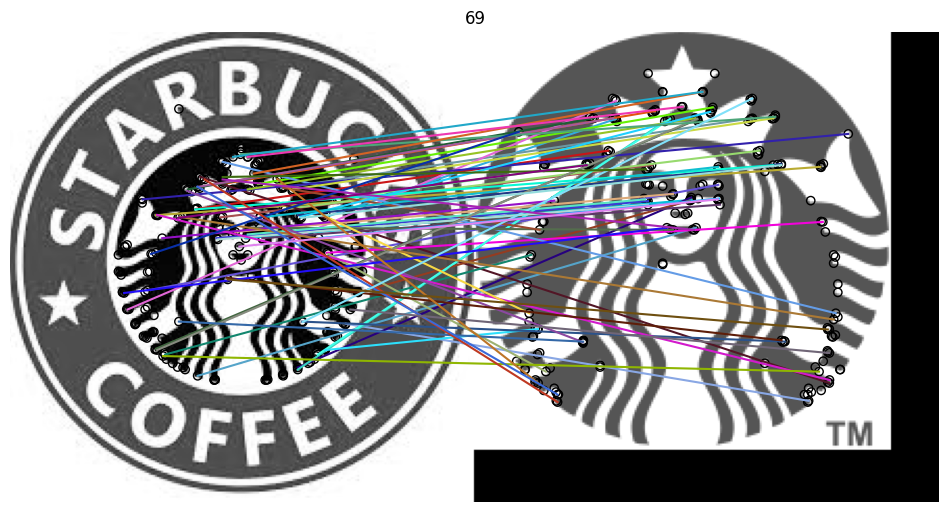

In [ ]:
# solution

starbucks_image  = io.imread('starbucks/starbucks.jpg',as_gray=True)
for image_path in os.listdir('starbucks'):
  if image_path != 'starbucks.jpg' and (image_path[-3:] == "jpg" or image_path[-3:] =="png"):
    starbucks_image_2 = io.imread('starbucks/'+image_path,as_gray=True)
    (keypoints1,keypoints2),(descriptors1,descriptors2) = get_ORB(starbucks_image,starbucks_image_2,n_keypoints=200, harris_k=0.02)
    matches = match_descriptors(descriptors1, descriptors2, cross_check=True)

    fig, axs = plt.subplots(figsize=(12,12))
    plot_matches(plt, starbucks_image, starbucks_image_2, keypoints1, keypoints2, matches)
    plt.axis('off')
    plt.title(len(matches))
    plt.show()

*   Comment on the performance of the algorithm with respect to each image. When do you think the algorithm works better?

**Solution**

We can see that the algorithm failed for some points in 1st and 2nd images by detecting false prediction. However for the rest, it performed well except some small number of false predictions. We believe that this is because ORB can be considered not scale invariant, hence in case of the first two images it can underperform because of the change of the scale. We also decreased the hassis_k to 0.02 since with that parameter the model was giving less false predictions

...

### Exercise: #4

*   Repeate **Exercise #2**, by changing the orientation of the model image by rotating it and comparing it with its original version.
*   Create 8 orientations of the model image by rotating the image by 45&deg; (0, 45, 90, 135, 180, 225, 270, 315). *Hint: You can use the rotate() function from skimage.transform.*

<ipython-input-40-ea285b7d3f70>:11: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  plot_matches(plt, starbucks_image, rotated, keypoints1, keypoints2, matches)


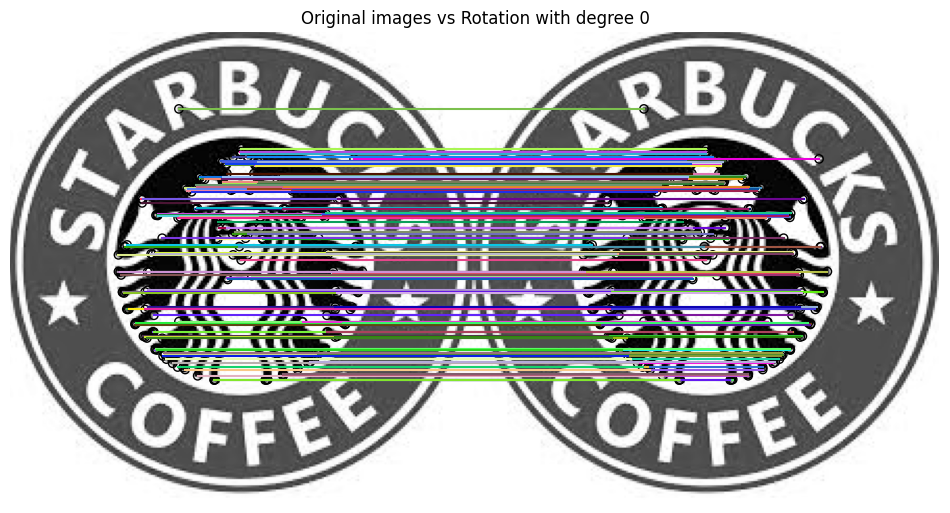

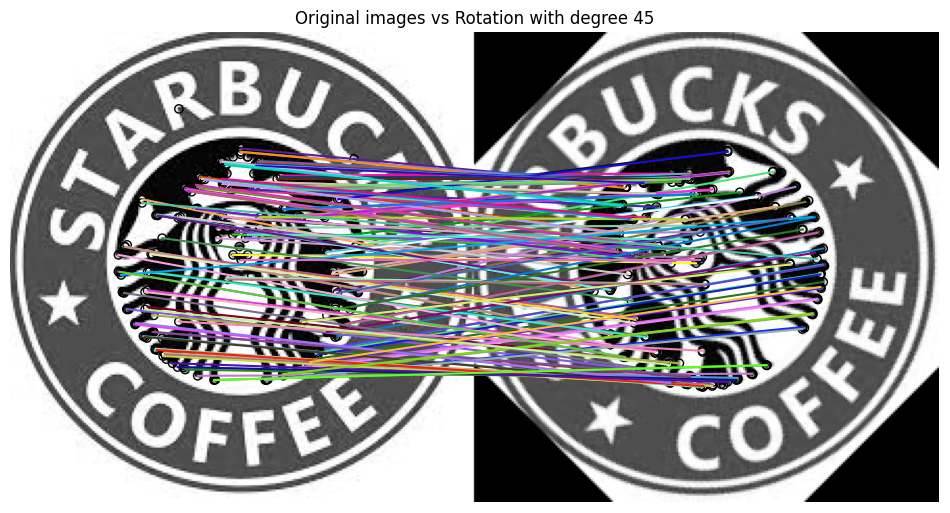

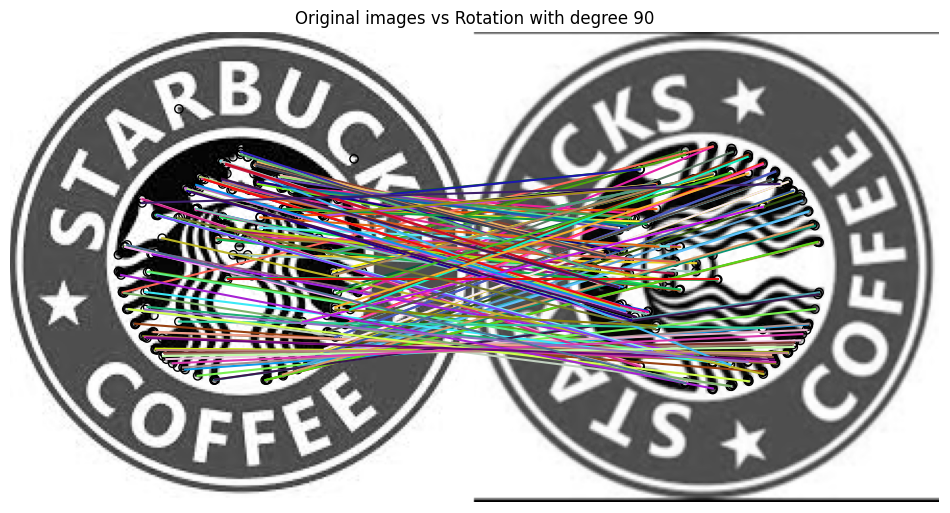

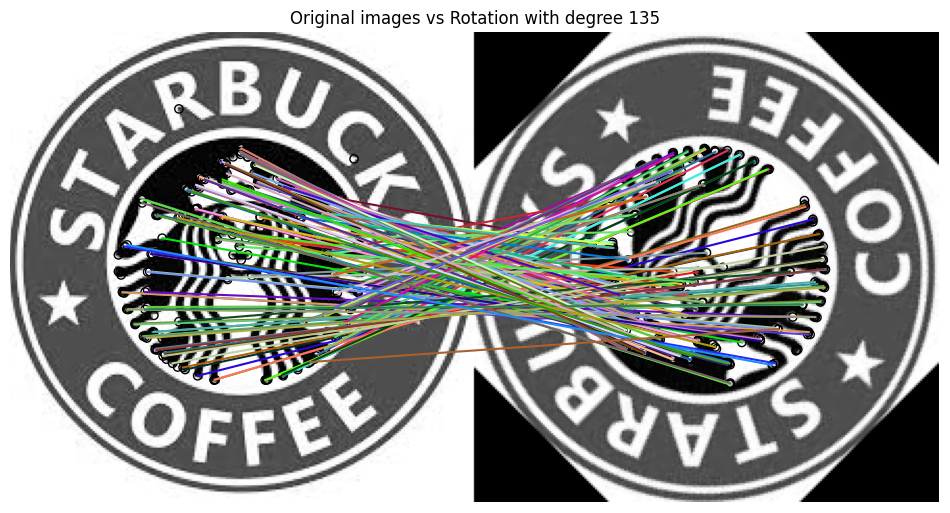

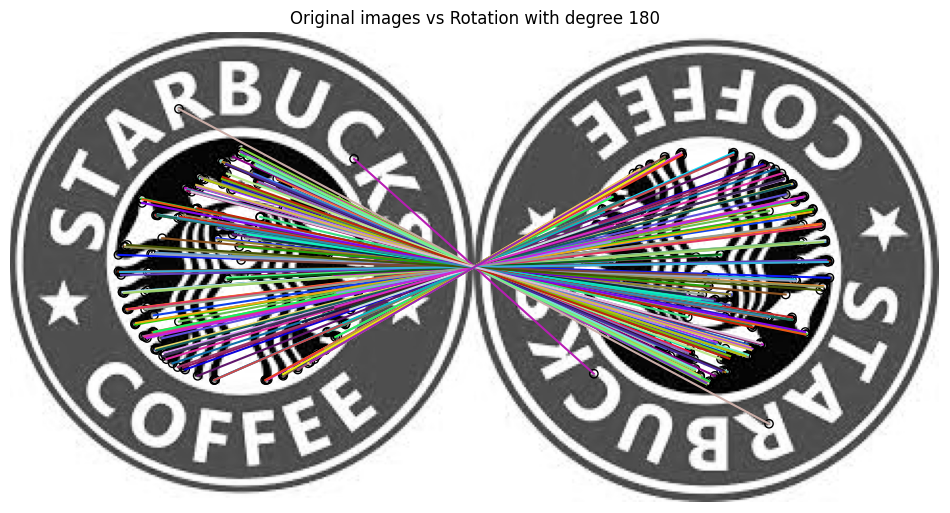

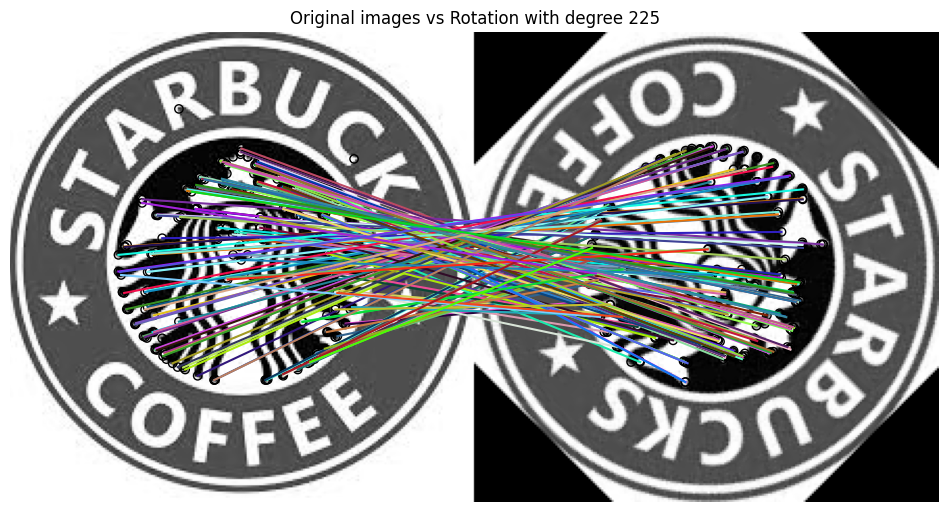

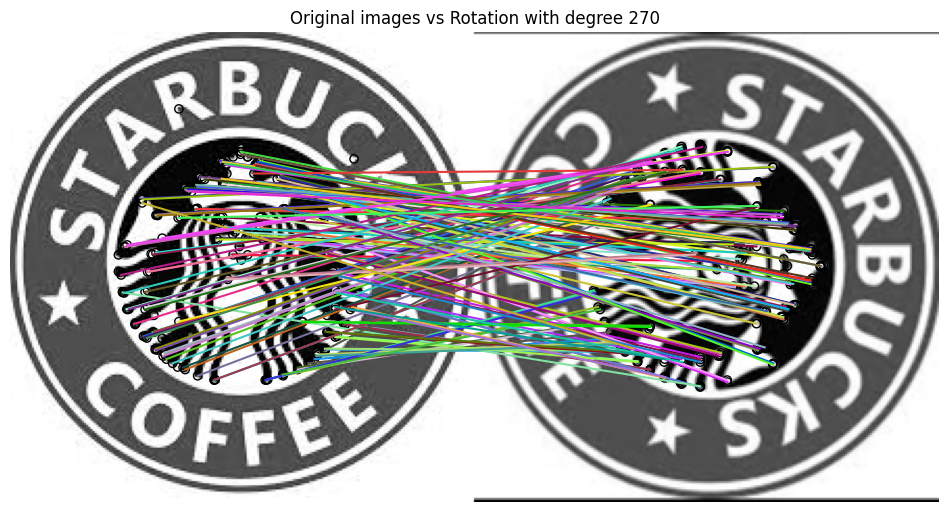

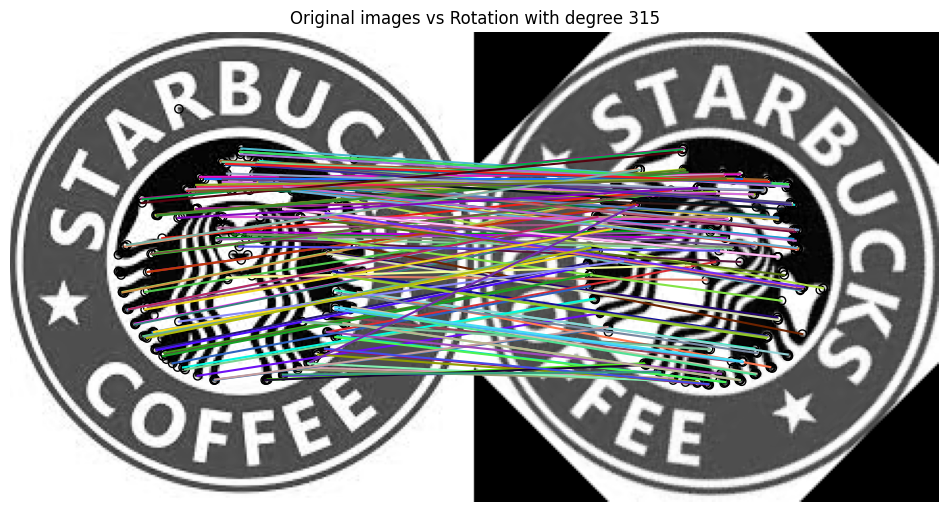

In [ ]:
# solution
orienations = [0, 45, 90, 135, 180, 225, 270, 315]
for orientation in orienations:

  starbucks_image  = io.imread('starbucks/starbucks.jpg',as_gray=True)
  rotated = transform.rotate(starbucks_image,orientation)
  (keypoints1,keypoints2),(descriptors1,descriptors2) = get_ORB(starbucks_image,rotated,n_keypoints=200, harris_k=0.02)
  matches = match_descriptors(descriptors1, descriptors2, cross_check=True)

  fig, axs = plt.subplots(figsize=(12,12))
  plot_matches(plt, starbucks_image, rotated, keypoints1, keypoints2, matches)
  plt.axis('off')
  plt.title(f"Original images vs Rotation with degree {orientation}")
  plt.show()



*   What do you observe with respect to the change in orientations?

**Solution**

For certain rotations only some small number of keypoints are not matched (the keypoints near the letters), but overall the algorithm works well with the given rotations, as it matches almost every keypoint correctly, hence we can say that in this case the algorithm is rotation invariant.

...

### Exercise: #5

*   Repeat **Exercise #3** using Coco-cola images using cocacola_logo.png as the model image.
*   Does the same parameters used for Starbucks images work in this case? Or was it necessary to modify the ORB parameters?

<ipython-input-41-77a42307e4e1>:11: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  plot_matches(plt, image, image_2, keypoints1, keypoints2, matches)


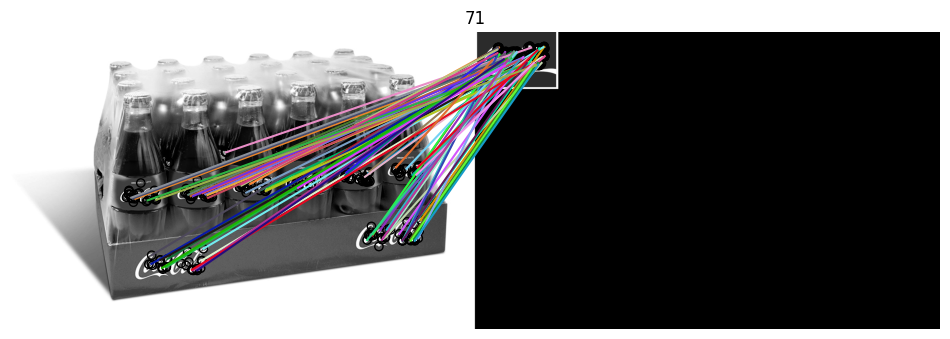

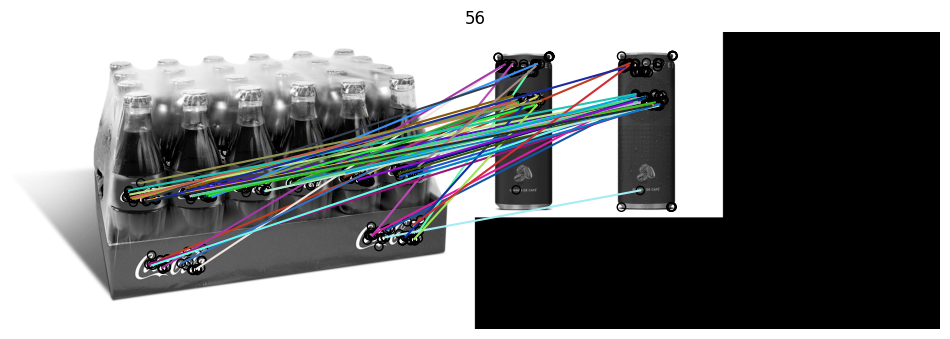

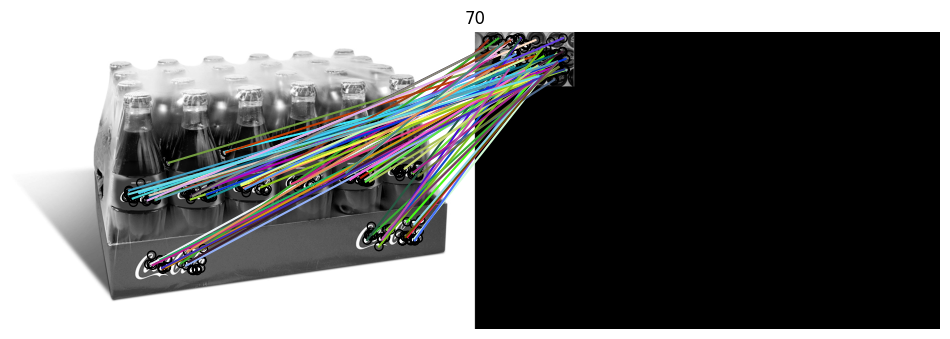

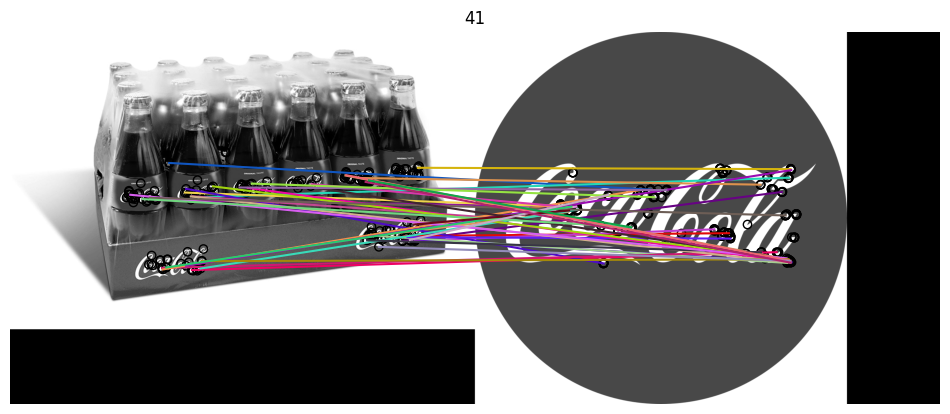

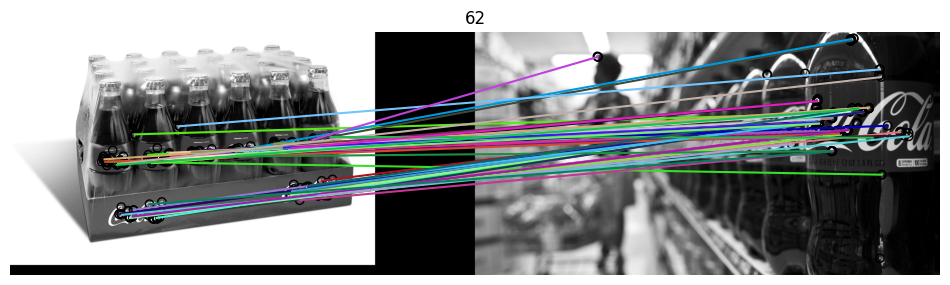

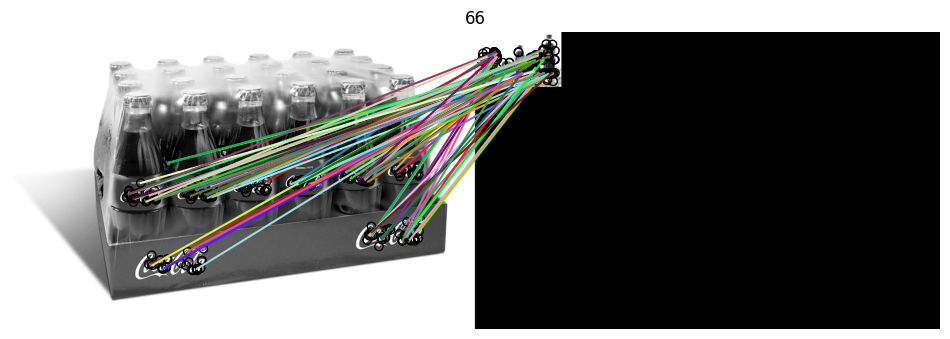

In [ ]:
# solution

image  = io.imread('cocacola/cocacola1.jpg',as_gray=True)
for image_path in os.listdir('cocacola'):
  if image_path != 'cocacola1.jpg' and (image_path[-3:] == "jpg" or image_path[-3:] =="png"):
    image_2 = io.imread('cocacola/'+image_path,as_gray=True)
    (keypoints1,keypoints2),(descriptors1,descriptors2) = get_ORB(image,image_2,n_keypoints=200, harris_k=0.02)
    matches = match_descriptors(descriptors1, descriptors2, cross_check=True)

    fig, axs = plt.subplots(figsize=(12,12))
    plot_matches(plt, image, image_2, keypoints1, keypoints2, matches)
    plt.axis('off')
    plt.title(len(matches))
    plt.show()



**Solution**
We tried changing the n_keypoints, which resulted in worse images. Decreasing the harris_k did not give any significant change here, so we decided to use the same parameters as in starbucks' case

...

### Exercise #6. Analysis of the applied techniques and results

*   What are the advantages of ORB object detection compared with HOG object detector?

**Solution**
ORB is fast and efficient. Hence, it can be used real time and in low power devices. HOG, in contrast, may require a big computational resource, especcially when the orientation is a big number. But, we believe that when choosing which model to use, we shouldn't concentrate only on these factors. It is better to try both of them, and see which of the models is performing better for our datasets.


*   What would happen if you analyse an image that does not contain the Starbucks logo (as is the case of "edificio.jpg")?

<ipython-input-43-f80fb2a9dd0a>:8: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  plot_matches(plt, starbucks_image, image_2, keypoints1, keypoints2, matches)


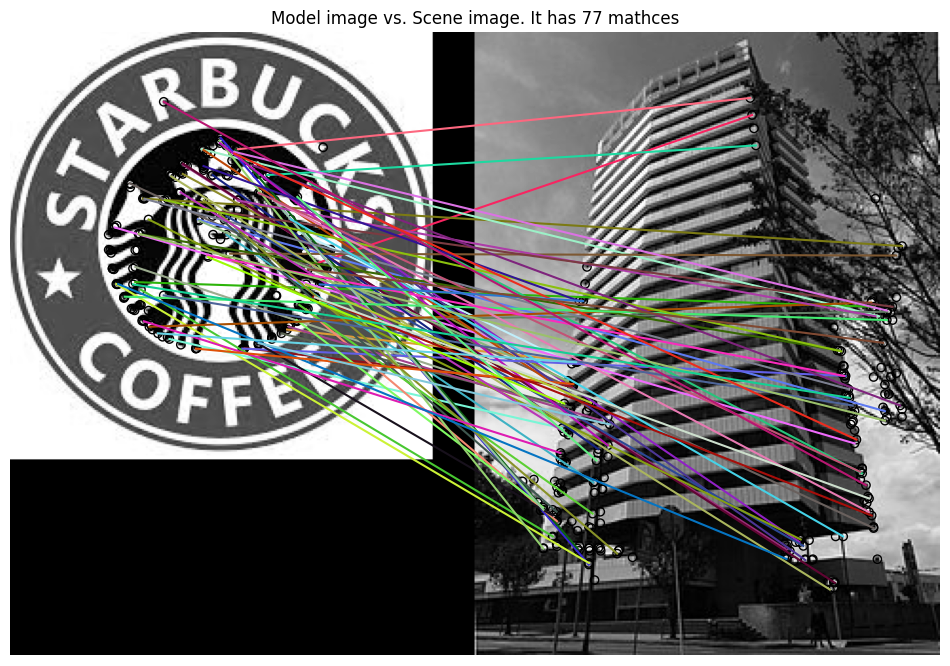

In [ ]:
# solution
starbucks_image  = io.imread('starbucks/starbucks.jpg',as_gray=True)
image_2 = io.imread('edificio.jpg',as_gray=True)
(keypoints1,keypoints2),(descriptors1,descriptors2) = get_ORB(starbucks_image,image_2)
matches = match_descriptors(descriptors1, descriptors2, cross_check=True)

fig, axs = plt.subplots(figsize=(12,12))
plot_matches(plt, starbucks_image, image_2, keypoints1, keypoints2, matches)
plt.axis('off')
plt.title("Model image vs. Scene image. It has "+str(len(matches))+" mathces")
plt.show()



**Solution**

As ORB analyzes compares inensity of the pixel with the pixels in the circular ring arround it, but since for matching is done using Hamming distance and binary descriptors, false matches occur in this image.

...

# Panorama Stitching (Not graded)

Image Mosaicing is a technique of combining multiple overlapping images into a single image.

*   A simple tutorial can be found in this notebook:
*   https://github.com/scikit-image/skimage-tutorials/blob/main/lectures/solutions/adv3_panorama-stitching-solution.ipynb


---

# **End of P5: Corner Detection and ORB**

This notebook is part of **Deliverable 2**

Deadline for Deliverable 2 (P4 and P5) submission in CampusVirtual is: **Monday, the 28th of October, 2024**
